In [16]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import NMF, LatentDirichletAllocation
import numpy as np

import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff
from wordcloud import WordCloud
sns.set()

import pickle

import matplotlib.pyplot as plt

# machine learning
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LogisticRegression     # Logistic Regression
from sklearn.naive_bayes import MultinomialNB           # Naive Bayes
from sklearn.svm import LinearSVC                       # SVM
from sklearn.ensemble import RandomForestClassifier     # Random Forest

from sklearn.decomposition import TruncatedSVD

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

from sklearn.calibration import CalibratedClassifierCV

In [17]:
num_rows_to_preview = 10

df = pd.read_csv("./tdc.csv", sep='\t', header=1, names=['id', 'label', 'text'], dtype={ 'label': str, 'text': str})

# df = df[(df['label'] == '__label__Kinh_doanh_va_Cong_nghiep') | (df['label'] == '__label__Tai_chinh')]

print(df.head(num_rows_to_preview))

   id                                 label  \
0   1                      __label__Nha_dat   
1   2                      __label__Nha_dat   
2   3                      __label__Nha_dat   
3   4                      __label__Mua_sam   
4   5                      __label__Nha_dat   
5   6                    __label__Tai_chinh   
6   7                      __label__Mua_sam   
7   8                      __label__Du_lich   
8   9  __label__Mang_internet_va_vien_thong   
9  10                      __label__Nha_dat   

                                                text  
0  phòng quanh khu_vực hồ tùng mậu phòng khép_kín...  
1  thuê nhà_riêng dt sàn phòng ngủ thoáng mát an_...  
2  thuê tầng khép_kín nguyễn_khoái bếp đầy_đủ tủ_...  
3  crumpler jackpack full photo giá vnđ vnđ đựng ...  
4  đăng hộ chủ ngõ đào_tấn lotte công_viên thủ_lệ...  
5  công_ty phát_sinh công_việc bắt_buộc nhân_viên...  
6  pin hãng samsung galaxy_grand prime g cell mad...  
7  miền đất mạc dubai mênh_mông sa_mạc dub

## Data Visualizations

In [18]:
# Unique labels
print(df['label'].unique())

['__label__Nha_dat' '__label__Mua_sam' '__label__Tai_chinh'
 '__label__Du_lich' '__label__Mang_internet_va_vien_thong'
 '__label__Nha_va_vuon' '__label__Kinh_doanh_va_Cong_nghiep'
 '__label__Nghe_thuat' '__label__Giao_duc' '__label__Lam_dep_va_the_hinh'
 '__label__Con_nguoi_va_xa_hoi' '__label__Sach' '__label__Chinh_tri'
 '__label__Do_an_va_do_uong' '__label__Giao_thong'
 '__label__Thoi_quen_va_so_thich' '__label__Giai_tri'
 '__label__Suc_khoe_va_benh_tat' '__label__Phap_luat' '__label__Khoa_hoc'
 '__label__May_tinh_va_thiet_bi_dien_tu' '__label__Cong_nghe_moi'
 '__label__The_thao']


In [19]:
# Group data by label to show the number of text that fall into that category.
categories_statistics_df = df.groupby(by='label')['text'].agg([
                                ('count', lambda x: x.size),
                                ('mean_text_len', lambda x: x.str.len().mean()),
                                ('max_text_len', lambda x: x.str.len().max()),
                                ('min_text_len', lambda x: x.str.len().min())
                            ])\
                            .reset_index()\
                            .sort_values(by='count', ascending=False)
                            
print(categories_statistics_df)

                                    label  count  mean_text_len  max_text_len  \
15                       __label__Nha_dat   2542     369.423682          3354   
9      __label__Kinh_doanh_va_Cong_nghiep   2355     981.234395         19811   
3               __label__Do_an_va_do_uong   2355     612.346072          4475   
20                     __label__Tai_chinh   1379    1065.898477         19811   
13                       __label__Mua_sam   1169     507.592814         18166   
4                        __label__Du_lich    879    1088.160410         15338   
0                      __label__Chinh_tri    796     758.369347         14253   
6                       __label__Giao_duc    697    1993.209469         15081   
14                    __label__Nghe_thuat    609     676.243021          6151   
11   __label__Mang_internet_va_vien_thong    593     288.844857          1444   
18                          __label__Sach    413     604.493947          2904   
1            __label__Con_ng

In [20]:
categories_text_df = df.groupby(by='label')\
                        .agg({
                            'text': ' '.join
                        })\
                        .reset_index()

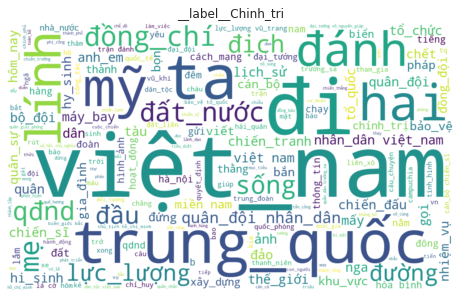

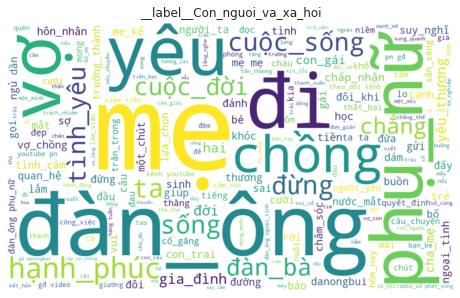

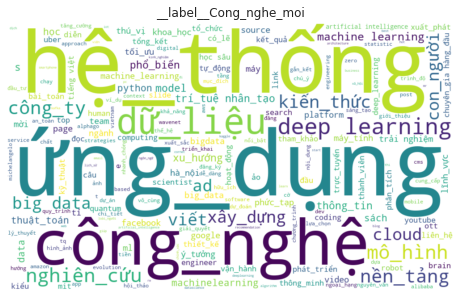

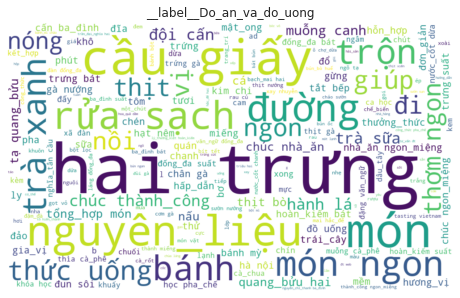

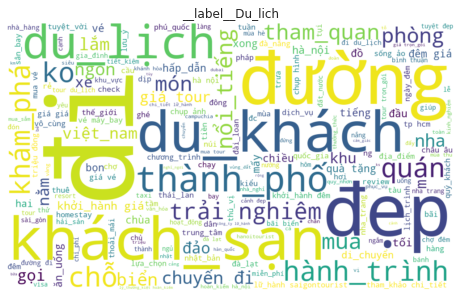

...

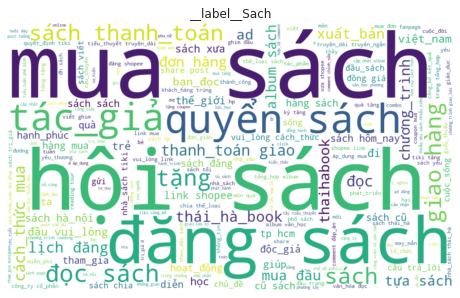

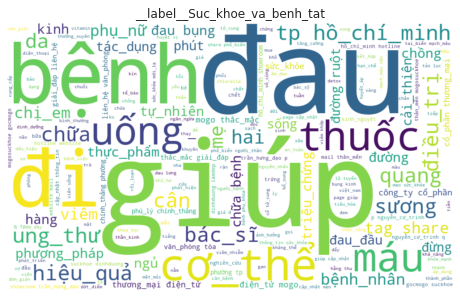

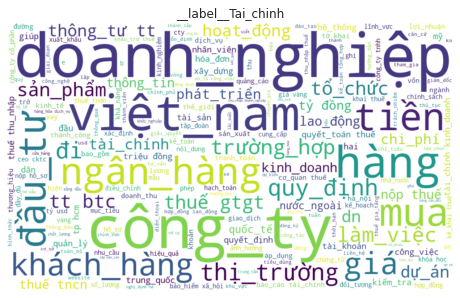

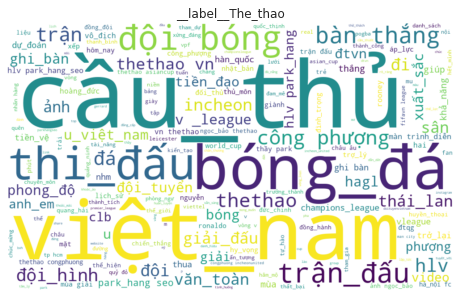

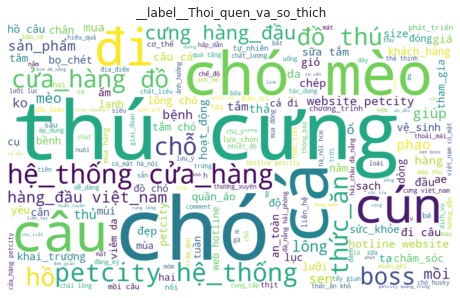

In [21]:
def plot_word_cloud(category_name, category_text):
    plt.subplots(figsize=(8, 8))
    wc = WordCloud(background_color="white", width=1000, height=600)
    wc.generate(category_text)
    plt.title(label=category_name)
    plt.axis("off")
    plt.imshow(wc, interpolation="bilinear")
    plt.show()

for idx, row in categories_text_df.iterrows():
    plot_word_cloud(row['label'], row['text'])

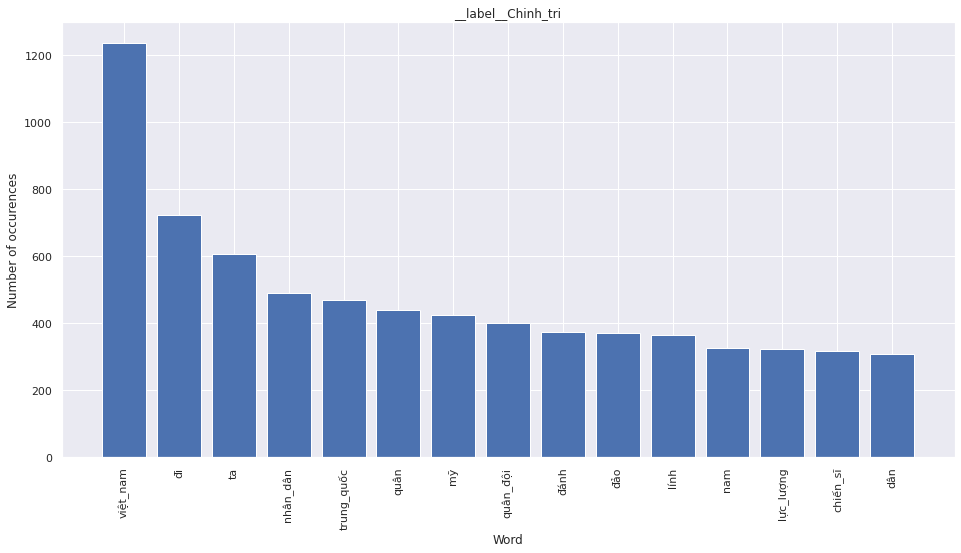

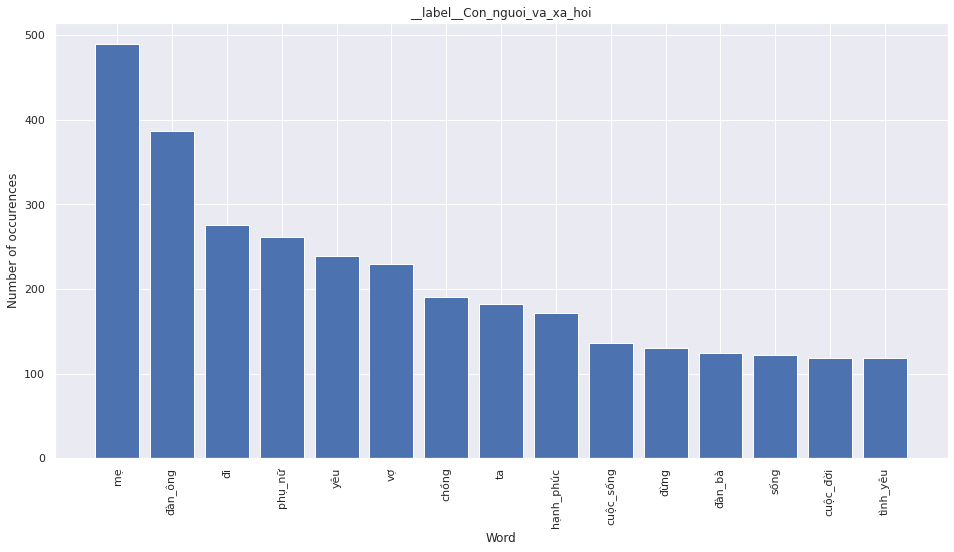

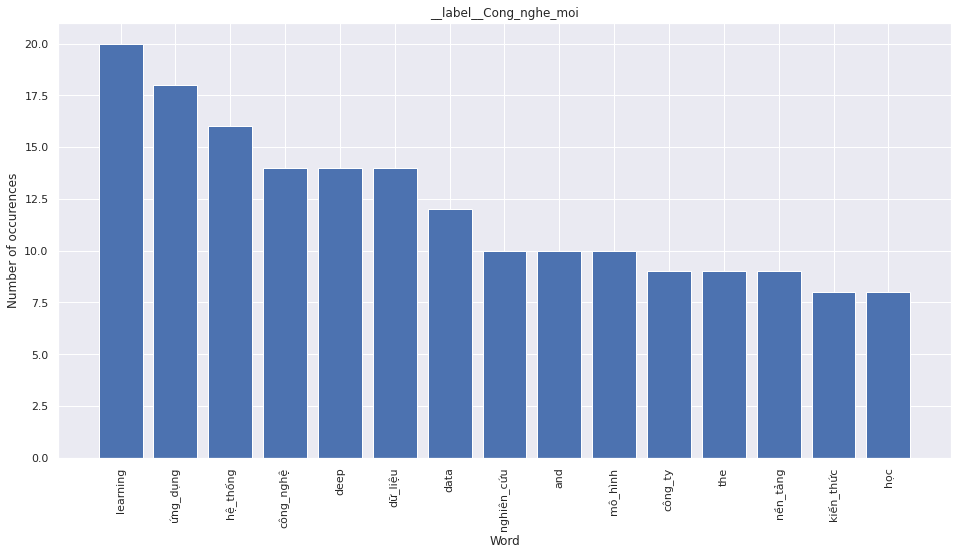

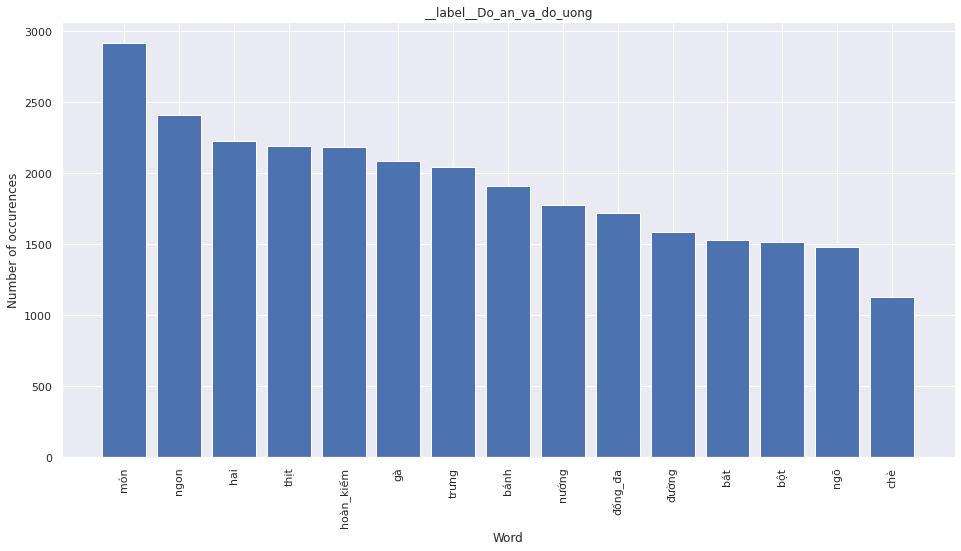

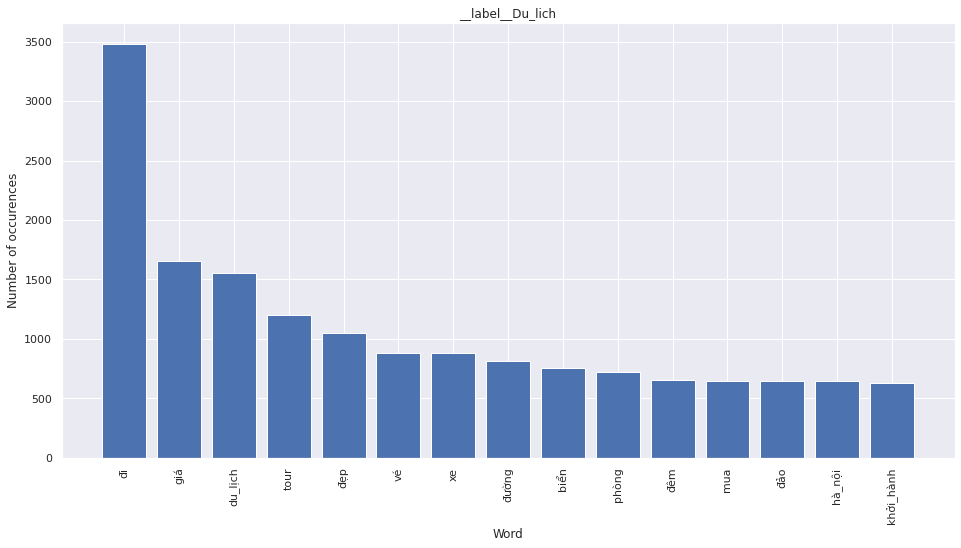

...

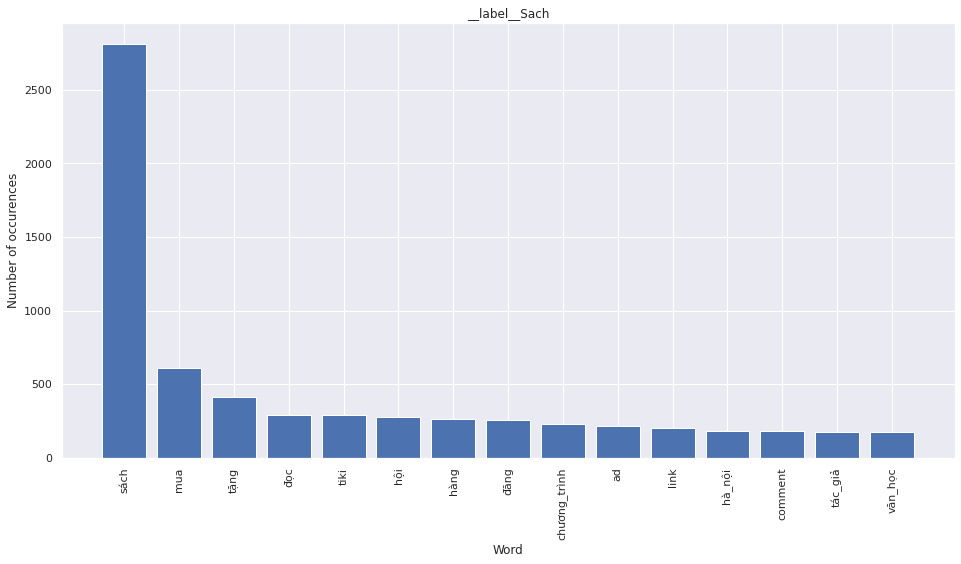

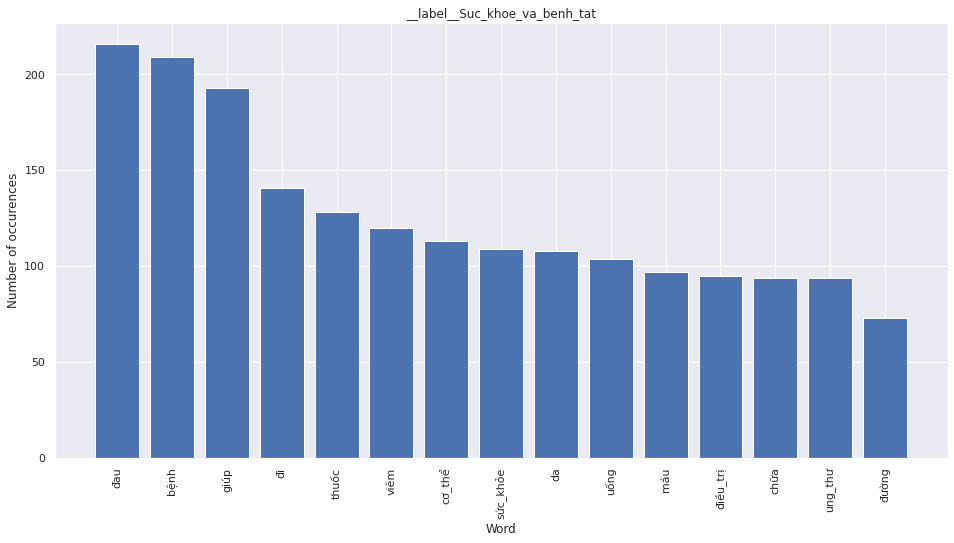

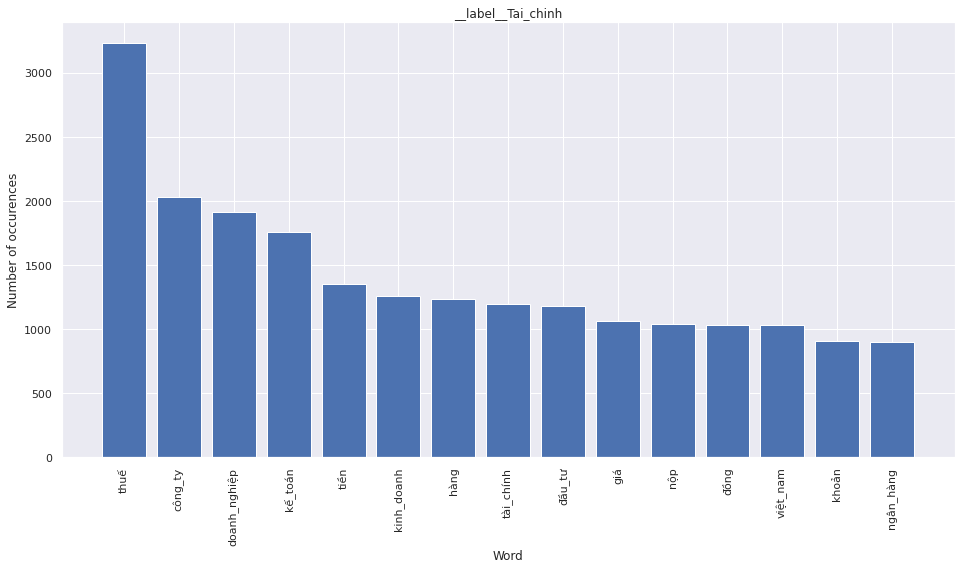

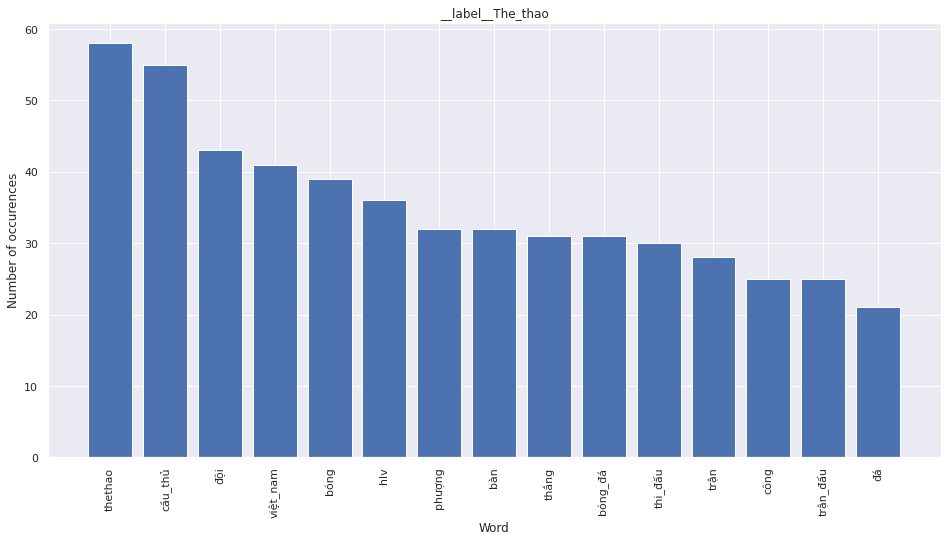

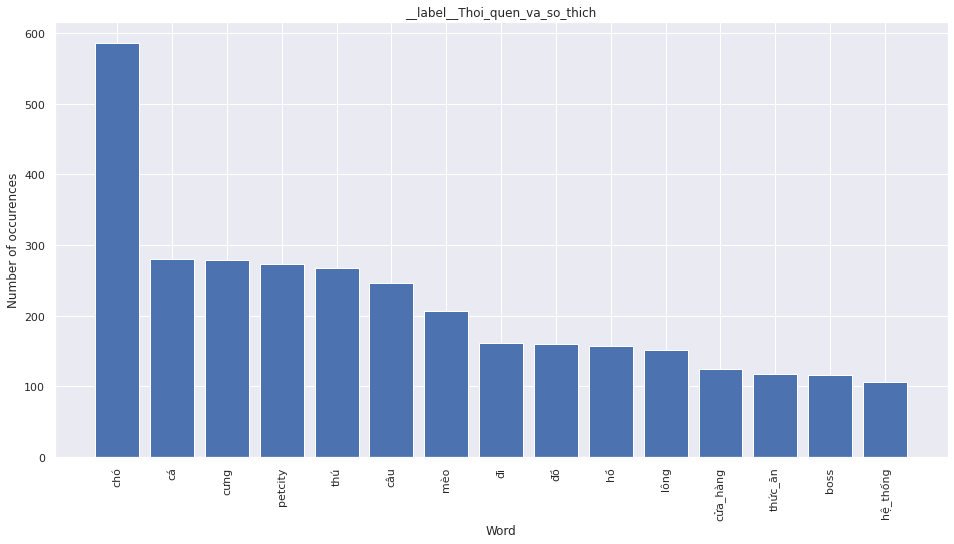

In [22]:
# Define helper functions
def get_top_n_words(n_top_words, count_vectorizer, text_data):
    '''
    returns a tuple of the top n words in a sample and their 
    accompanying counts, given a CountVectorizer object and text sample
    '''
    vectorized_text = count_vectorizer.fit_transform(text_data)
    vectorized_total = np.sum(vectorized_text, axis=0)
    word_indices = np.flip(np.argsort(vectorized_total)[0,:], 1)
    word_values = np.flip(np.sort(vectorized_total)[0,:],1)
    
    word_vectors = np.zeros((n_top_words, vectorized_text.shape[1]))
    for i in range(n_top_words):
        word_vectors[i,word_indices[0,i]] = 1

    words = [word[0].encode('utf8').decode('utf-8') for 
             word in count_vectorizer.inverse_transform(word_vectors)]

    return (words, word_values[0,:n_top_words].tolist()[0])

def plot_word_count_chart(n_top_words, category_name, category_text):
    count_vectorizer = CountVectorizer()
    words, word_values = get_top_n_words(n_top_words=n_top_words,
                                        count_vectorizer=count_vectorizer, 
                                        text_data=category_text)

    fig, ax = plt.subplots(figsize=(16,8))
    ax.bar(range(len(words)), word_values)
    ax.set_xticks(range(len(words)))
    ax.set_xticklabels(words, rotation='vertical')
    ax.set_title(category_name)
    ax.set_xlabel('Word')
    ax.set_ylabel('Number of occurences')
    plt.show()

for idx, row in categories_text_df.iterrows():
    plot_word_count_chart(15, row['label'], [row['text']])


In [23]:
X = df['text']
y = df['label']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=2, stratify=y)

# X_test.to_csv("./example_test.csv", sep="\t", header=None, index=None)
# y_test.to_csv("./result.csv", sep="\t", header=None, index=None)

## Data Preprocessing

## Process data

In [24]:
# text vectorizer
vectorizer = TfidfVectorizer(max_df=0.6, min_df=100, max_features=5000)

# Logistic Regression classifier
lr_clf = LogisticRegression(C=1.0, solver='newton-cg', multi_class='multinomial')

# Naive Bayes classifier
nb_clf = MultinomialNB(alpha=0.01)

# SVM classifier
svm_clf = LinearSVC(C=1.0)

# Random Forest classifier
random_forest_clf = RandomForestClassifier(n_estimators=100, criterion='gini', 
                                           max_depth=50, random_state=0)

pipeline = Pipeline([
    ('vect', vectorizer),
    ('clf', lr_clf)
])                                        

In [25]:
clf = CalibratedClassifierCV(base_estimator=svm_clf, cv=5, method='isotonic')
pipeline = Pipeline([
    ('vect', vectorizer),
    ('clf', clf)
])

In [26]:
%%time
pipeline.fit(X_train, y_train)

CPU times: user 6.42 s, sys: 11.7 ms, total: 6.43 s
Wall time: 6.44 s


Pipeline(steps=[('vect',
                 TfidfVectorizer(max_df=0.6, max_features=5000, min_df=100)),
                ('clf',
                 CalibratedClassifierCV(base_estimator=LinearSVC(), cv=5,
                                        method='isotonic'))])

In [27]:
model_export = "./trained_model.sav"
pickle.dump(pipeline, open(model_export, "wb"))

In [28]:
%%time
y_pred = pipeline.predict(X_test)

CPU times: user 818 ms, sys: 3.79 ms, total: 822 ms
Wall time: 820 ms


In [29]:
def get_classification_report(y_true, y_pred, target_names):
    
    # calculate classification report, and convert it to DataFrame
    clf_report = classification_report(y_true=y_true, y_pred=y_pred,
                                       target_names=target_names,
                                       output_dict=True)
    clf_report_df = pd.DataFrame(data=clf_report)
    clf_report_df = clf_report_df.T
    clf_report_df.drop(columns=['support'], inplace=True)
    
    measures = clf_report_df.columns.tolist()
    classes = clf_report_df.index.tolist()
    
    # create plotly annotated heatmap, and update styling
    fig = ff.create_annotated_heatmap(clf_report_df.values,
                                      x=measures,
                                      y=classes)
    fig.update_layout(autosize=False,
                      width=1000, height=1000,
                      title_text='<i><b>Classification report</b></i>',
                      xaxis_title="Measures", yaxis_title="Class",
                      plot_bgcolor='rgba(0, 0, 0, 0)',
                      paper_bgcolor= 'rgba(0, 0, 0, 0)',
                      font={
                          'family': "Courier New, monospace",
                          'size': 12,
                          # 'color': "#eaeaea"
                      }
                     )
    fig.update_xaxes(tickangle=-45)
    fig['data'][0]['showscale'] = True

    return fig

fig = get_classification_report(y_true=y_test, y_pred=y_pred, target_names=pipeline.classes_)
fig.show()

In [30]:
def get_confusion_matrix(y_true, y_pred, labels):
    
    # claculate confusion matrix
    conf_matrix = confusion_matrix(y_true=y_true,
                                   y_pred=y_pred,
                                   labels=labels)
    conf_matrix = np.flipud(conf_matrix)
    
    # create annotated heat map of the confusion matrix
    fig = ff.create_annotated_heatmap(conf_matrix,
                                      x=labels.tolist(),
                                      y=labels.tolist()[::-1])
    fig.update_layout(autosize=False,
                      width=1000, height=1000,
                      title_text='<i><b>Confusion matrix</b></i>',
                      xaxis_title="Predicted category", yaxis_title="Real category",
                      plot_bgcolor='rgba(0, 0, 0, 0)',
                      paper_bgcolor= 'rgba(0, 0, 0, 0)',
                      font={
                          'family': "Courier New, monospace",
                          'size': 12,
                          # 'color': "#eaeaea"
                      }
                     )
    fig.update_xaxes(tickangle=-45)
    fig['data'][0]['showscale'] = True
    
    return fig

fig = get_confusion_matrix(y_true=y_test, y_pred=y_pred, labels=pipeline.classes_)
fig.show()